# Digital Signal Processing

In [55]:
import csv
import matplotlib.pyplot as plt
import numpy as np

In [204]:
def MAF(data, X, size_of_t):
    filtered_data = []
    for i in range(size_of_t):
        if i < X:
            #compensating for lack of data
            filtered_data.append(sum(data[:i+1])/(i+1))
        else:
            filtered_data.append(sum(data[i-X+1:i+1])/X)
    return filtered_data

In [205]:
def IIR(data, size_of_t, A, B):
    filtered_data = [data[0]]
    for i in range(1, size_of_t):
        new_average = A * filtered_data[i-1] + B * data[i]
        filtered_data.append(new_average)
    return filtered_data

In [224]:
def FIR(data, weights, X, size_of_t):
    filtered_data = []
    for i in range(size_of_t):
        convulation = 0
        for j in range(X):
            if i - j >= 0:  # Check boundary
                convulation += data[i - j] * weights[j]
        filtered_data.append(convulation)

    return filtered_data

In [290]:
def FIR_alt(data, weights, X, size_of_t):
    filtered_data = []
    for i in range(size_of_t):
        convulation = 0
        for j in range(X):
            if i + j < size_of_t:  # Check boundary
                convulation += data[i + j] * weights[j]
        filtered_data.append(convulation)

    return filtered_data

In [222]:
#TEST- DELETE!!!!
X = 5
data1 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  
sig_weights = [0.1, 0.2, 0.3, 0.1, 0.2]

filtered_output = FIR(data1, sig_weights, X, 10)
print("Filtered Output:", filtered_output)

Filtered Output: [2.8, 3.7, 4.6000000000000005, 5.5, 6.4, 7.300000000000001, 6.0, 5.6, 2.9, 1.0]


In [208]:
def FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil_name, extra_info):
    Fs = sample_rate
    Ts = 1.0 / Fs  # sampling interval
    ts = np.arange(0, t[-1], Ts)  # time vector
    y = data1  # the data to make the fft from
    z = filtered_data  # the data to make the fft from
    n = len(y)  # length of the signal
    k = np.arange(n)
    T = n / Fs
    frq = k / T  # two sides frequency range
    frq = frq[range(int(n/2))]  # one side frequency range
    Y = np.fft.fft(y) / n  # fft computing and normalization
    Y = Y[range(int(n/2))]
    Z = np.fft.fft(z) / n  # fft computing and normalization
    Z = Z[range(int(n/2))]

    #plt.figure(figsize=(40, 20))
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), constrained_layout=True)
    ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
    ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Amplitude')

    ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')  # plotting the fft
    ax2.loglog(frq, abs(Z), 'b', label='Filtered', markersize=5, linewidth=3, color='red')  # plotting the fft
    ax2.set_xlabel('Freq (Hz)')
    ax2.set_ylabel('|Y(freq)|')

    signal_titles = {1: 'Signal A', 2: 'Signal B', 3: 'Signal C', 4: 'Signal D'}
    signal_name = signal_titles.get(sig, "Unknown Signal")

    filter_titles = {1: 'MAF', 2: 'IIR', 3: 'FIR'}
    filter_name = filter_titles.get(fil_name, "Unknown Filter")

    title = f'{signal_name} - {filter_name} - {extra_info}'
    plt.suptitle(title)

    filename = title.replace(' ', '_').replace('-', '_').replace(':', '_').replace(',', '_') + '.png'
    plt.savefig(filename)
    plt.show()

# Sig A

In [291]:
t = [] # column 0
data1 = [] # column 1
data2 = [] # column 2

with open('sigA.csv') as f:
    # open the csv file
    reader = csv.reader(f)
    for row in reader:
        # read the rows 1 one by one
        t.append(float(row[0])) # leftmost column
        data1.append(float(row[1])) # second column
        #data2.append(float(row[2])) # third column

size_of_t = len(t)
sample_rate = size_of_t/t[-1]
sig = 1
#print("Size of t:", size_of_t)

for i in range(size_of_t):
    # print the data to verify it was read
    #print(str(t[i]) + ", " + str(data1[i]) + ", " + str(data2[i]))
    print(str(t[i]) + ", " + str(data1[i]))


0.0, 2.3580832635385773
0.0001, 2.615750351752668
0.0002, 2.85571184573269
0.00030000000000000003, 2.8735256729254357
0.0004, 2.1195354857013906
0.0005, 1.9858658787163883
0.0006000000000000001, 3.441462113590727
0.0007, 2.283491051279485
0.0008, 2.552706319745801
0.0009000000000000001, 2.6207633414518177
0.001, 2.2564461012236205
0.0011, 2.713997635597904
0.0012000000000000001, 3.0374548927491345
0.0013000000000000002, 3.4628299107905476
0.0014, 2.7616793847351353
0.0015, 3.2073038927325666
0.0016, 3.3238298442791407
0.0017000000000000001, 3.0121421751660145
0.0018000000000000002, 3.186237108054149
0.0019, 3.2310911761528938
0.002, 3.823500974824496
0.0021000000000000003, 3.9710809965849903
0.0022, 3.9162613283083805
0.0023, 3.650307841168974
0.0024000000000000002, 2.9977120377743143
0.0025, 2.8647854905190164
0.0026000000000000003, 3.5930719491291288
0.0027, 4.187297104671781
0.0028, 3.6676959645293357
0.0029000000000000002, 4.1629970454651914
0.003, 3.213649188032436
0.0031000000000

In [292]:
print(sample_rate)

10000.20000400008


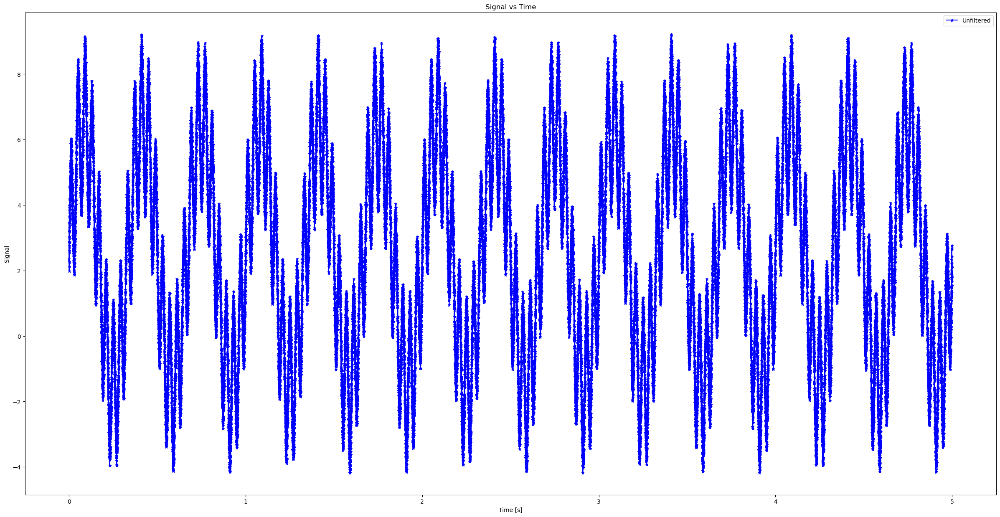

In [293]:
plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5)
plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
#plt.savefig("Line Trajectory.png")
plt.show()

### MAF

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3372002542.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3372002542.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


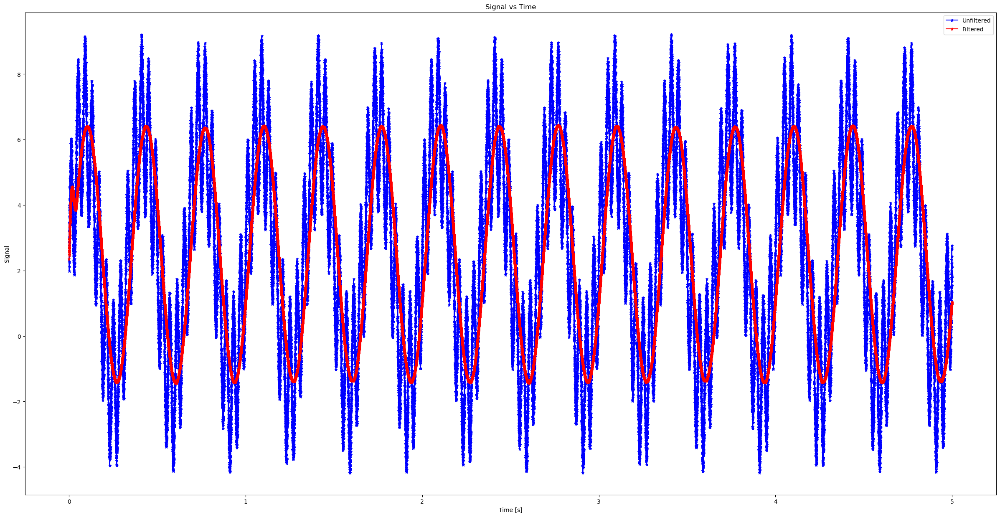

In [294]:
X = 400
filtered_data = MAF(data1, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigA MAF.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

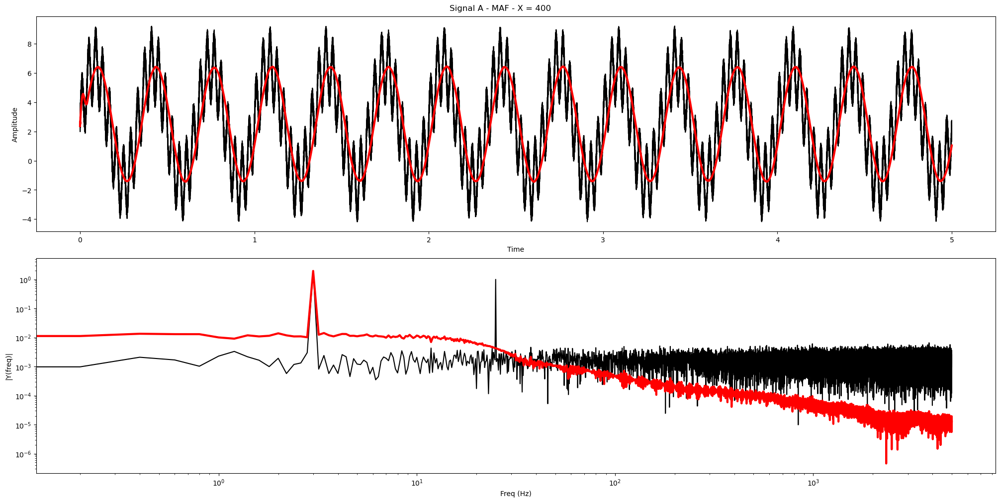

In [295]:
X = 400
fil = 1
filtered_data = MAF(data1, X, size_of_t)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 400")

## IIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2936128790.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2936128790.py:7: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


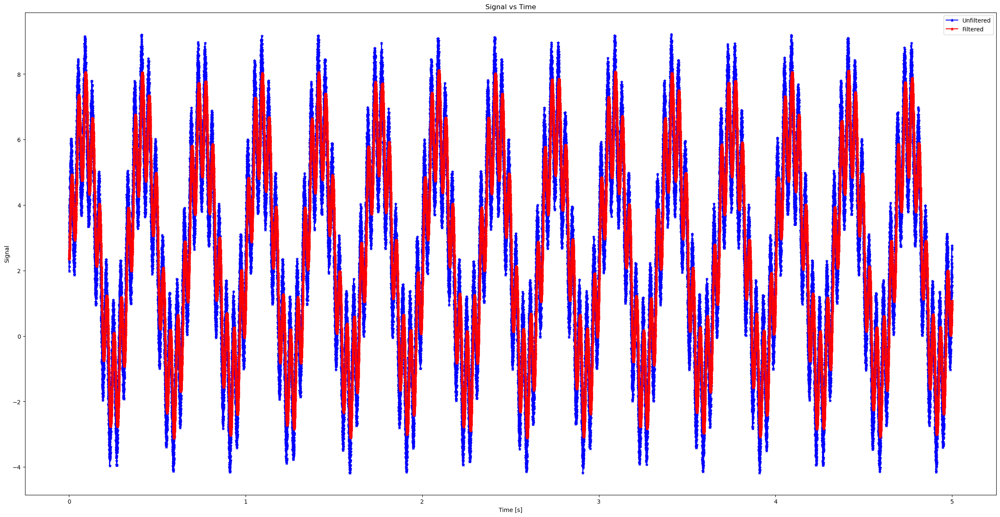

In [296]:
A = 0.98
B = 1 - A
filtered_data = IIR(data1, size_of_t, A, B)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigA IIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

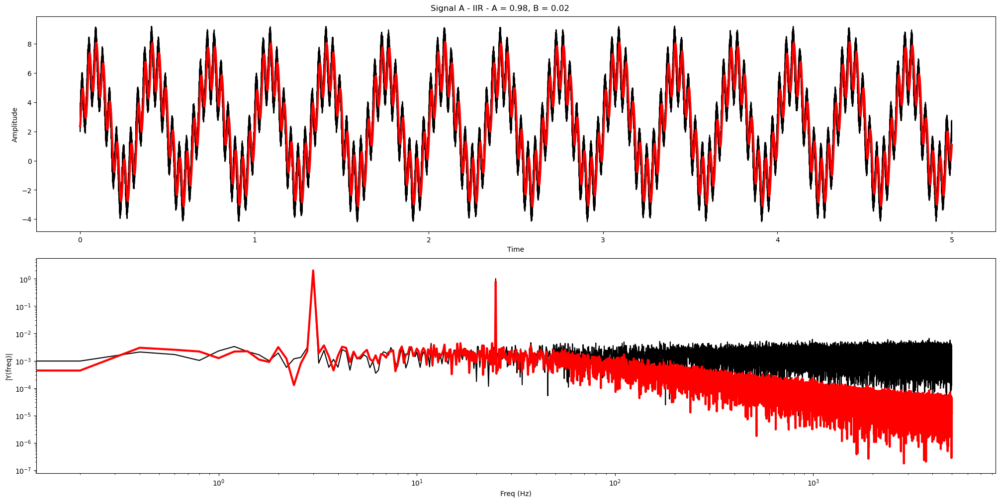

In [297]:
A = 0.98
B = 1 - A
fil = 2
filtered_data = IIR(data1, size_of_t, A, B)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "A = 0.98, B = 0.02")

## FIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2066900378.py:84: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2066900378.py:85: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


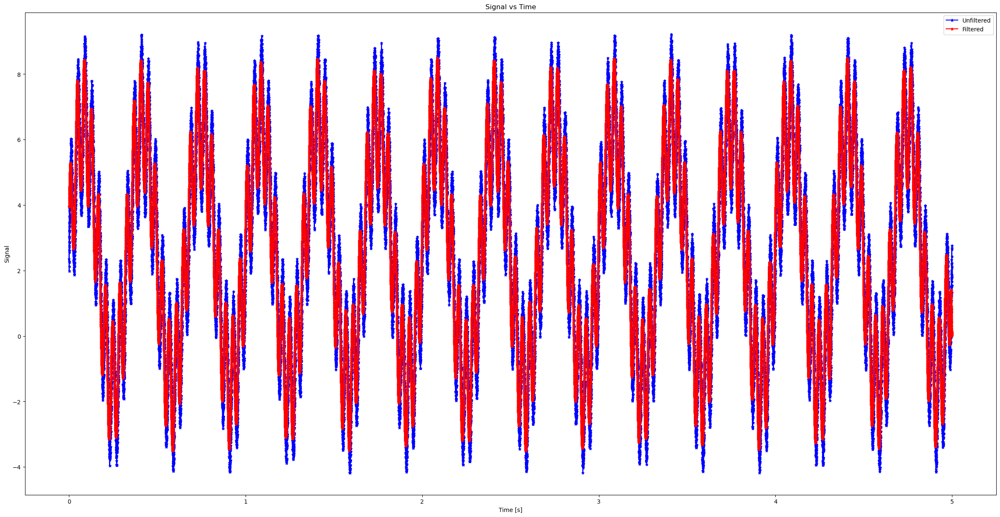

In [298]:
X = 77
sig_weights = [
    0.001039916658656899,
    0.001314019728261469,
    0.001628278245544688,
    0.001984363738200073,
    0.002383614945968861,
    0.002827001373267139,
    0.003315090176118976,
    0.003848016983390353,
    0.004425461210015958,
    0.005046626367946176,
    0.005710225819519894,
    0.006414474348663073,
    0.007157085848655646,
    0.007935277342277518,
    0.008745779462141867,
    0.009584853427264450,
    0.010448314457800560,
    0.011331561474869013,
    0.012229612837977194,
    0.013137147780275110,
    0.014048553113200133,
    0.014957974688487153,
    0.015859373028405014,
    0.016746582465742982,
    0.017613373074701264,
    0.018453514623491533,
    0.019260841740028428,
    0.020029319454322365,
    0.020753108265612972,
    0.021426627879263988,
    0.022044618768125305,
    0.022602200735399276,
    0.023094927690768610,
    0.023518837898188084,
    0.023870499011655368,
    0.024147047283615240,
    0.024346220408402230,
    0.024466383549122075,
    0.024506548189305581,
    0.024466383549122075,
    0.024346220408402230,
    0.024147047283615240,
    0.023870499011655368,
    0.023518837898188084,
    0.023094927690768610,
    0.022602200735399276,
    0.022044618768125305,
    0.021426627879263981,
    0.020753108265612972,
    0.020029319454322365,
    0.019260841740028421,
    0.018453514623491533,
    0.017613373074701264,
    0.016746582465742985,
    0.015859373028405014,
    0.014957974688487152,
    0.014048553113200133,
    0.013137147780275110,
    0.012229612837977194,
    0.011331561474869013,
    0.010448314457800560,
    0.009584853427264450,
    0.008745779462141867,
    0.007935277342277518,
    0.007157085848655646,
    0.006414474348663073,
    0.005710225819519894,
    0.005046626367946176,
    0.004425461210015958,
    0.003848016983390352,
    0.003315090176118976,
    0.002827001373267139,
    0.002383614945968862,
    0.001984363738200073,
    0.001628278245544688,
    0.001314019728261470,
    0.001039916658656899,
]
filtered_data = FIR(data1, sig_weights, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigA FIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

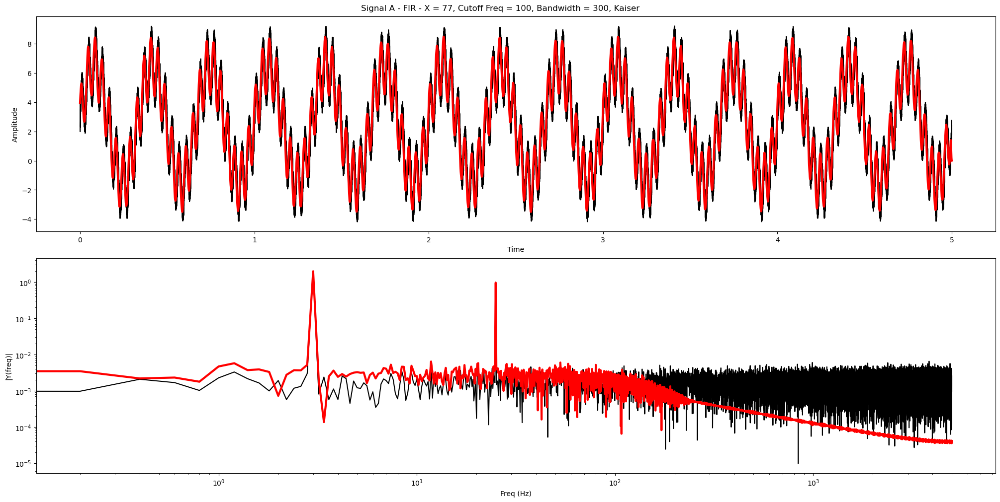

In [299]:
fil = 3
FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 77, Cutoff Freq = 100, Bandwidth = 300, Kaiser")

# Sig B

In [300]:
t = [] # column 0
data1 = [] # column 1
data2 = [] # column 2

with open('sigB.csv') as f:
    # open the csv file
    reader = csv.reader(f)
    for row in reader:
        # read the rows 1 one by one
        t.append(float(row[0])) # leftmost column
        data1.append(float(row[1])) # second column
        #data2.append(float(row[2])) # third column

size_of_t = len(t)
sample_rate = size_of_t/t[-1]
sig = 2
#print("Size of t:", size_of_t)

for i in range(size_of_t):
    # print the data to verify it was read
    #print(str(t[i]) + ", " + str(data1[i]) + ", " + str(data2[i]))
    print(str(t[i]) + ", " + str(data1[i]))


0.0, 6.19194348432419
0.00030303030303030303, 2.420961652128782
0.0006060606060606061, 12.683304962342826
0.0009090909090909091, 11.781546285711093
0.0012121212121212121, 13.414530269782018
0.0015151515151515152, 2.1049010560566943
0.0018181818181818182, 5.111956457649884
0.002121212121212121, 13.408418973079362
0.0024242424242424242, 6.002596213276581
0.0027272727272727275, 12.69435129203266
0.0030303030303030303, 10.384197824186582
0.003333333333333333, 7.884874947419641
0.0036363636363636364, 7.87326989351076
0.00393939393939394, 15.922856146674379
0.004242424242424242, 4.183723707038258
0.004545454545454545, 9.702544366818973
0.0048484848484848485, 7.178395272281764
0.005151515151515152, 13.995006868884705
0.005454545454545455, 9.320393842263716
0.005757575757575757, 7.332594058129463
0.006060606060606061, 9.884185322405141
0.006363636363636364, 11.386907519378315
0.006666666666666666, 14.85270129373345
0.0069696969696969695, 2.445746194737141
0.007272727272727273, 4.21749698635816

In [242]:
print(sample_rate)

3300.2000121219467


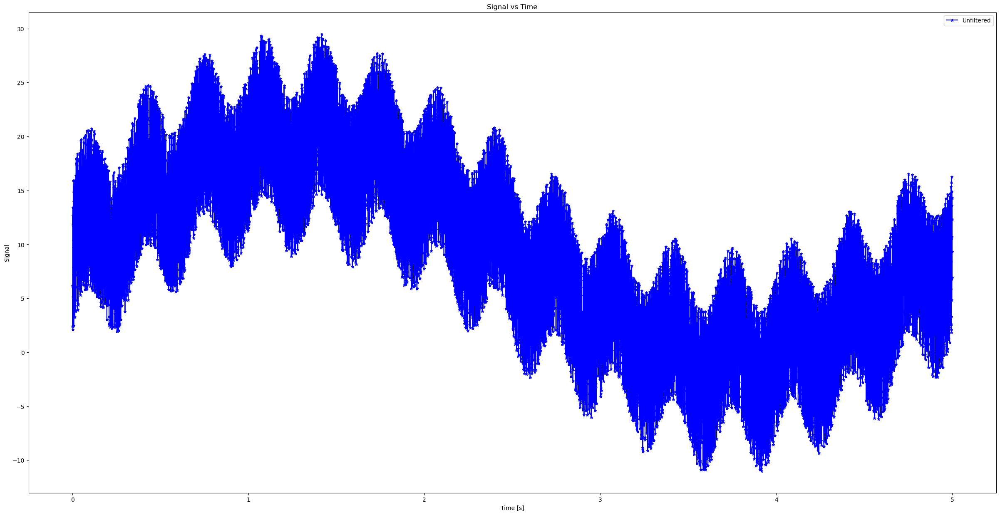

In [301]:
plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5)
plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
#plt.savefig("Line Trajectory.png")
plt.show()

## MAF

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3231803054.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3231803054.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


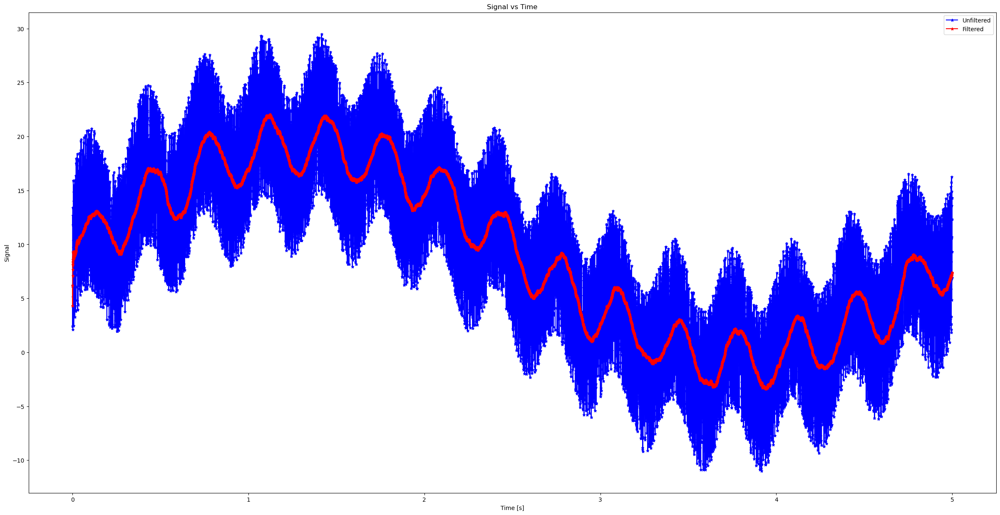

In [302]:
X = 200
filtered_data = MAF(data1, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigB MAF.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

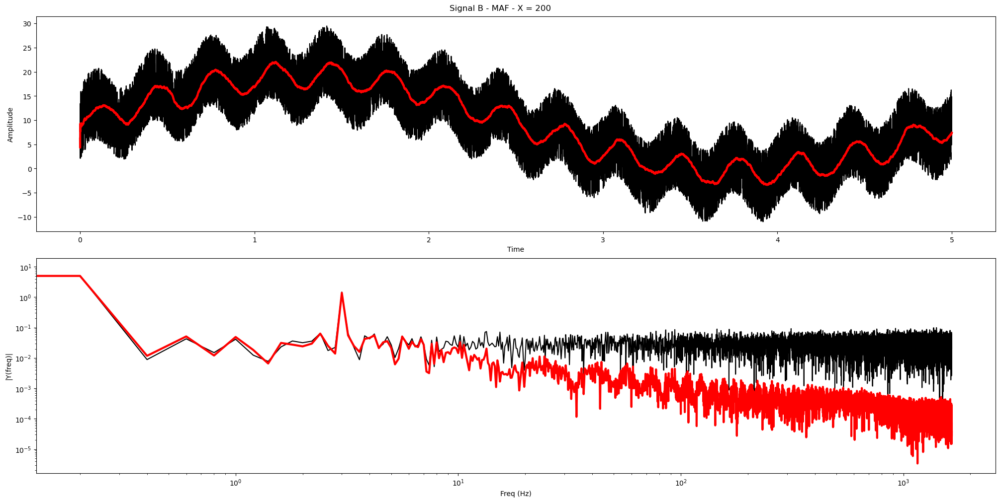

In [303]:
X = 200
fil = 1
filtered_data = MAF(data1, X, size_of_t)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 200")

## IIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3819482122.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3819482122.py:7: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


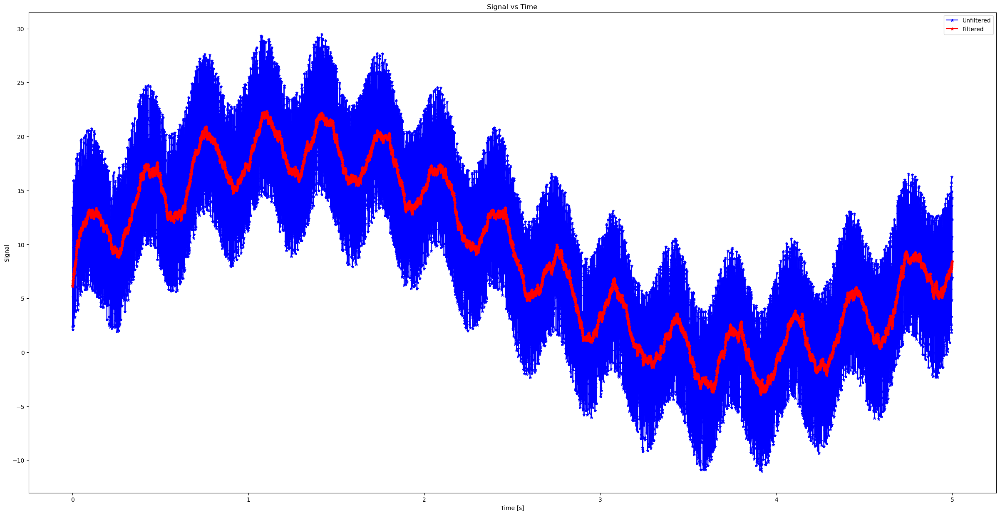

In [304]:
A = 0.98
B = 1 - A
filtered_data = IIR(data1, size_of_t, A, B)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigB IIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

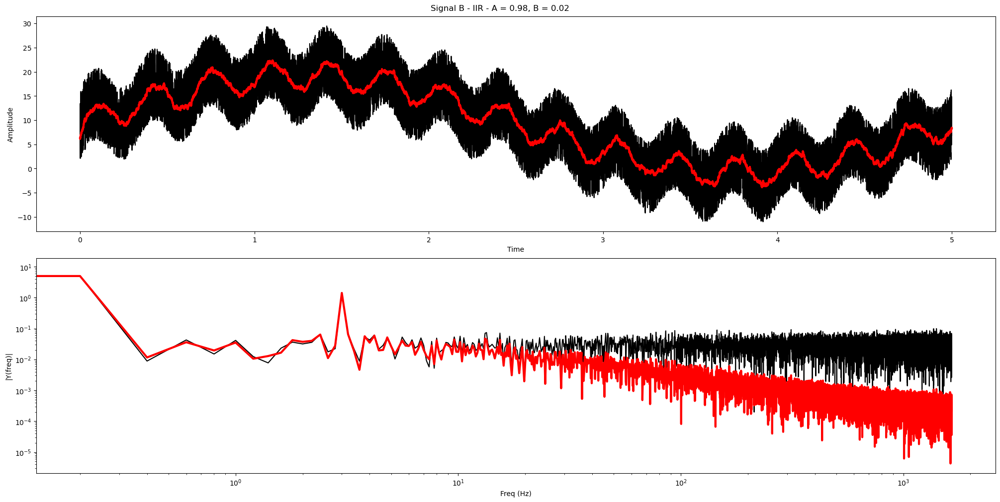

In [305]:
A = 0.98
B = 1 - A
fil = 2
filtered_data = IIR(data1, size_of_t, A, B)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "A = 0.98, B = 0.02")

## FIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/93799539.py:64: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/93799539.py:65: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


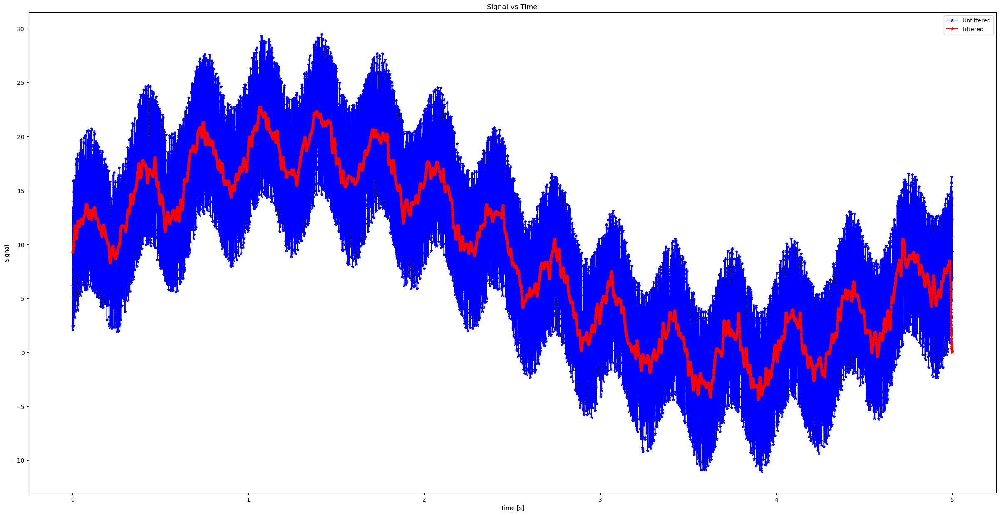

In [306]:
X = 57
sig_weights = [
    0.002519950945123121,
    0.003200555561023921,
    0.003965279177753558,
    0.004814153895085516,
    0.005745924142896251,
    0.006757989235817686,
    0.007846369256314174,
    0.009005695843324084,
    0.010229228970274864,
    0.011508900265511456,
    0.012835382871426267,
    0.014198187268322619,
    0.015585781918437234,
    0.016985737028058990,
    0.018384889194727038,
    0.019769524215066392,
    0.021125574889150081,
    0.022438830280488247,
    0.023695152586563791,
    0.024880697551324688,
    0.025982134214395533,
    0.026986859746124612,
    0.027883205164918178,
    0.028660627873392911,
    0.029309887180230018,
    0.029823199290609313,
    0.030194368643030371,
    0.030418892935587451,
    0.030494039710043420,
    0.030418892935587451,
    0.030194368643030371,
    0.029823199290609302,
    0.029309887180230018,
    0.028660627873392911,
    0.027883205164918178,
    0.026986859746124612,
    0.025982134214395530,
    0.024880697551324688,
    0.023695152586563791,
    0.022438830280488247,
    0.021125574889150081,
    0.019769524215066402,
    0.018384889194727038,
    0.016985737028058990,
    0.015585781918437234,
    0.014198187268322619,
    0.012835382871426267,
    0.011508900265511456,
    0.010229228970274864,
    0.009005695843324084,
    0.007846369256314170,
    0.006757989235817686,
    0.005745924142896251,
    0.004814153895085517,
    0.003965279177753558,
    0.003200555561023923,
    0.002519950945123121,
]
filtered_data = FIR(data1, sig_weights, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigB FIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

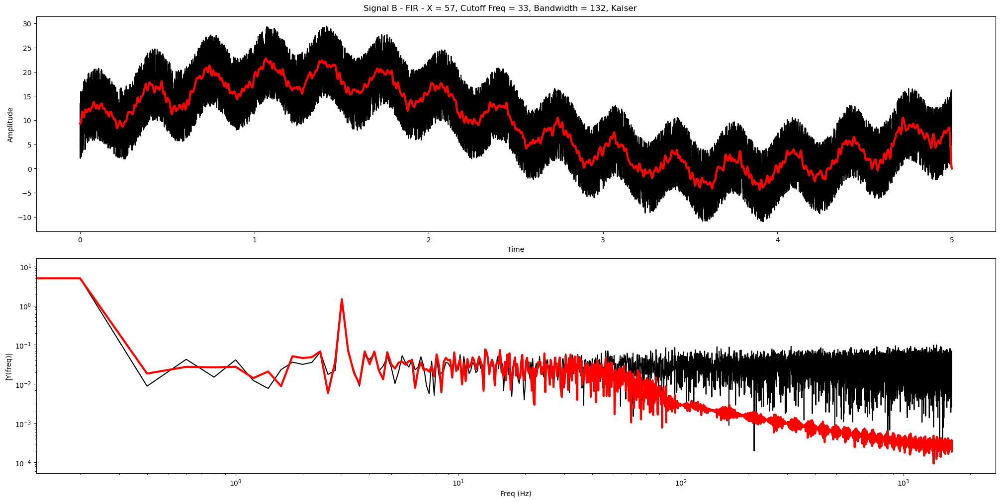

In [307]:
fil = 3
FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 57, Cutoff Freq = 33, Bandwidth = 132, Kaiser")

# Sig C

In [308]:
t = [] # column 0
data1 = [] # column 1
data2 = [] # column 2

with open('sigC.csv') as f:
    # open the csv file
    reader = csv.reader(f)
    for row in reader:
        # read the rows 1 one by one
        t.append(float(row[0])) # leftmost column
        data1.append(float(row[1])) # second column
        #data2.append(float(row[2])) # third column

size_of_t = len(t)
sample_rate = size_of_t/t[-1]
sig = 3
#print("Size of t:", size_of_t)

for i in range(size_of_t):
    # print the data to verify it was read
    #print(str(t[i]) + ", " + str(data1[i]) + ", " + str(data2[i]))
    print(str(t[i]) + ", " + str(data1[i]))


0.0, 0.0
0.0004, 0.0
0.0008, 0.0
0.0012000000000000001, 0.0
0.0016, 0.0
0.002, 0.0
0.0024000000000000002, 0.0
0.0028, 0.0
0.0032, 0.0
0.0036000000000000003, 0.0
0.004, 0.0
0.0044, 0.0
0.0048000000000000004, 0.0
0.005200000000000001, 0.0
0.0056, 0.0
0.006, 0.0
0.0064, 0.0
0.0068000000000000005, 0.0
0.007200000000000001, 0.0
0.0076, 0.0
0.008, 0.0
0.008400000000000001, 0.0
0.0088, 0.0
0.0092, 0.0
0.009600000000000001, 0.0
0.01, 0.0
0.010400000000000001, 0.0
0.0108, 0.0
0.0112, 0.0
0.011600000000000001, 0.0
0.012, 0.0
0.012400000000000001, 0.0
0.0128, 0.0
0.0132, 0.0
0.013600000000000001, 0.0
0.014, 0.0
0.014400000000000001, 0.0
0.0148, 0.0
0.0152, 0.0
0.015600000000000001, 0.0
0.016, 0.0
0.0164, 0.0
0.016800000000000002, 0.0
0.0172, 0.0
0.0176, 0.0
0.018000000000000002, 0.0
0.0184, 0.0
0.0188, 0.0
0.019200000000000002, 0.0
0.0196, 0.0
0.02, 0.0
0.0204, 0.0
0.020800000000000003, 0.0
0.0212, 0.0
0.0216, 0.0
0.022000000000000002, 0.0
0.0224, 0.0
0.0228, 0.0
0.023200000000000002, 0.0
0.0236,

In [309]:
print(sample_rate)

2500.1250062503127


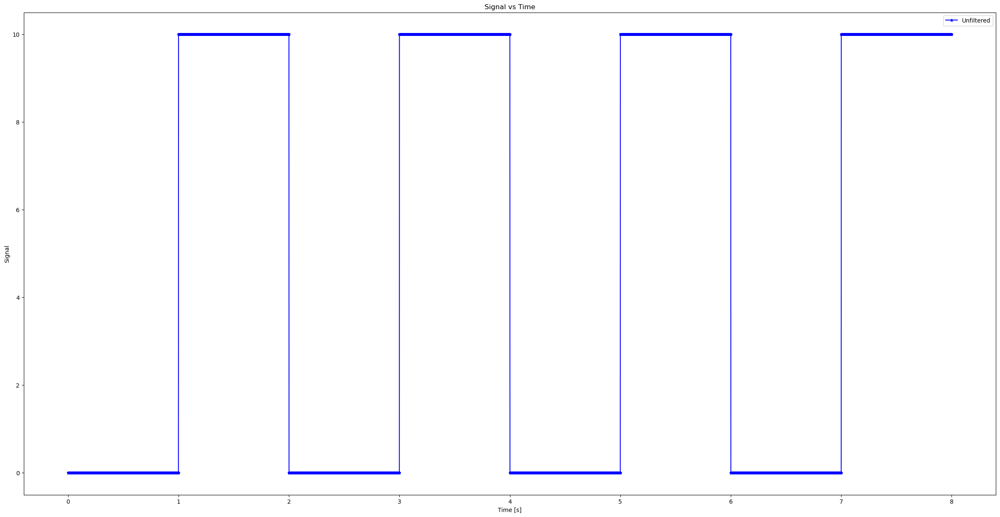

In [310]:
plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5)
plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
#plt.savefig("Line Trajectory.png")
plt.show()

## MAF

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/1255814910.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/1255814910.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


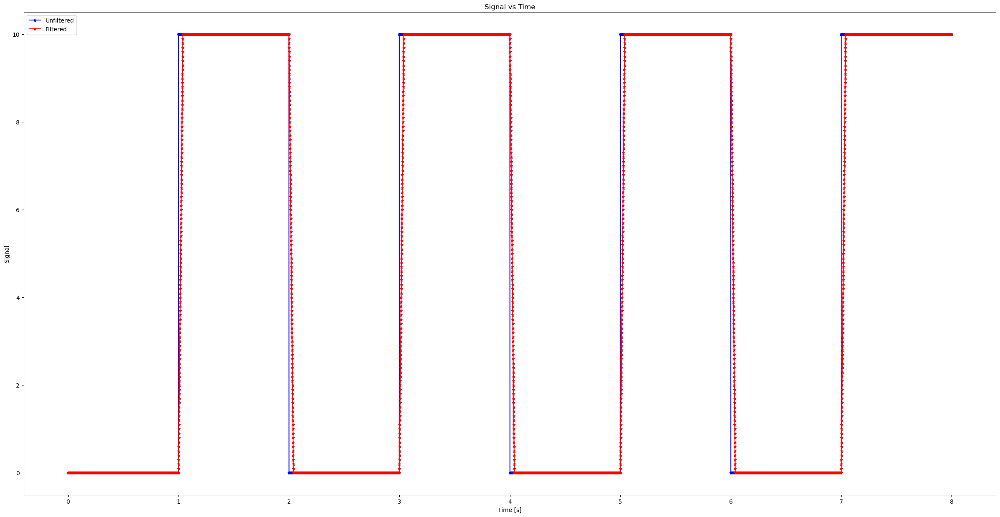

In [311]:
X = 100
filtered_data = MAF(data1, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigC MAF.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

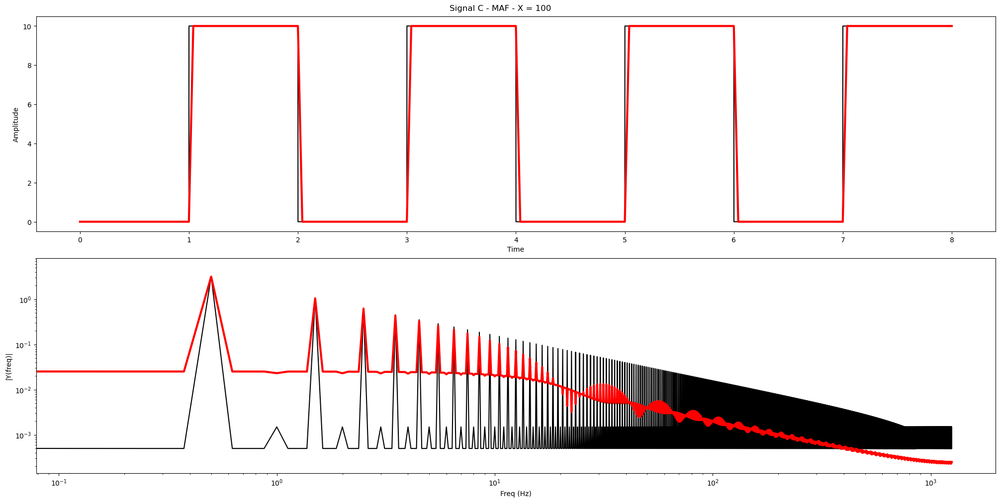

In [312]:
X = 100
fil = 1
filtered_data = MAF(data1, X, size_of_t)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 100")

## IIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/1467525224.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/1467525224.py:7: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


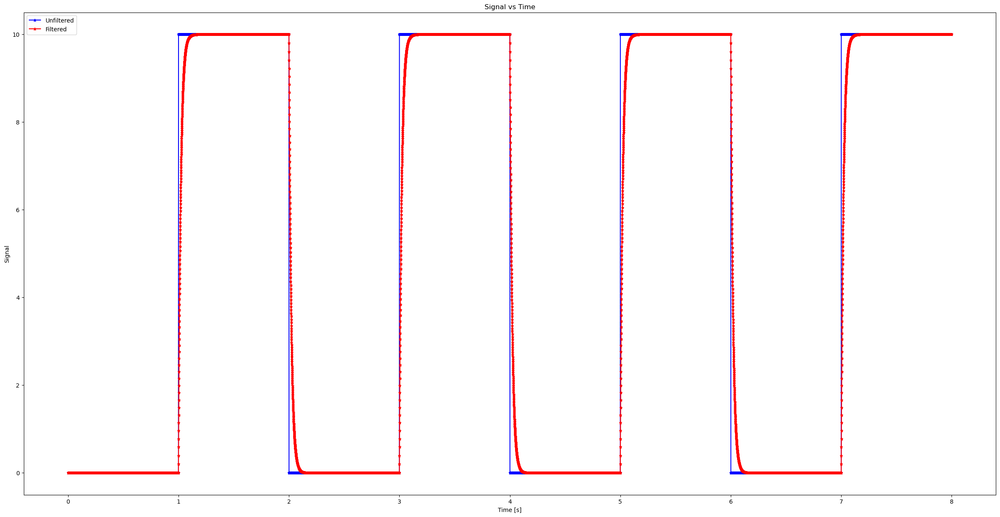

In [313]:
A = 0.98
B = 1 - A
filtered_data = IIR(data1, size_of_t, A, B)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigC IIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

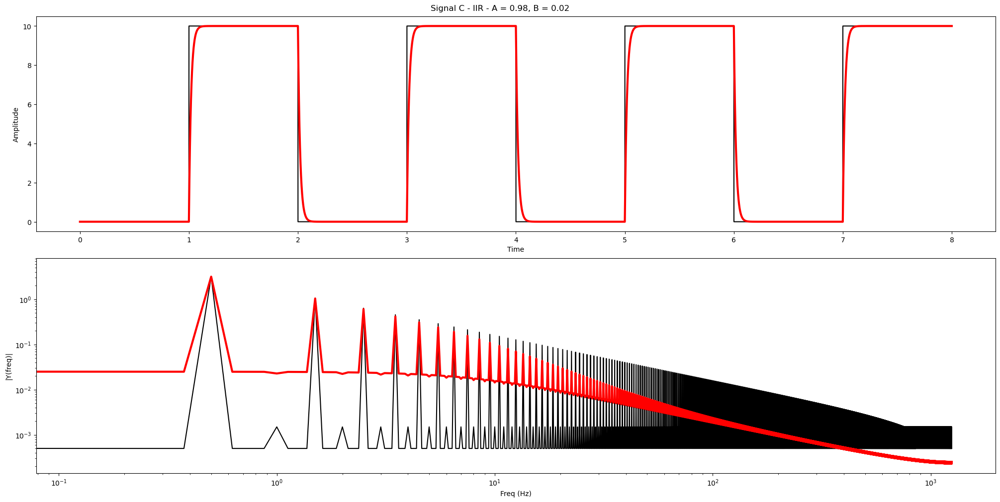

In [314]:
A = 0.98
B = 1 - A
fil = 2
filtered_data = IIR(data1, size_of_t, A, B)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "A = 0.98, B = 0.02")

## FIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/196237390.py:120: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/196237390.py:121: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


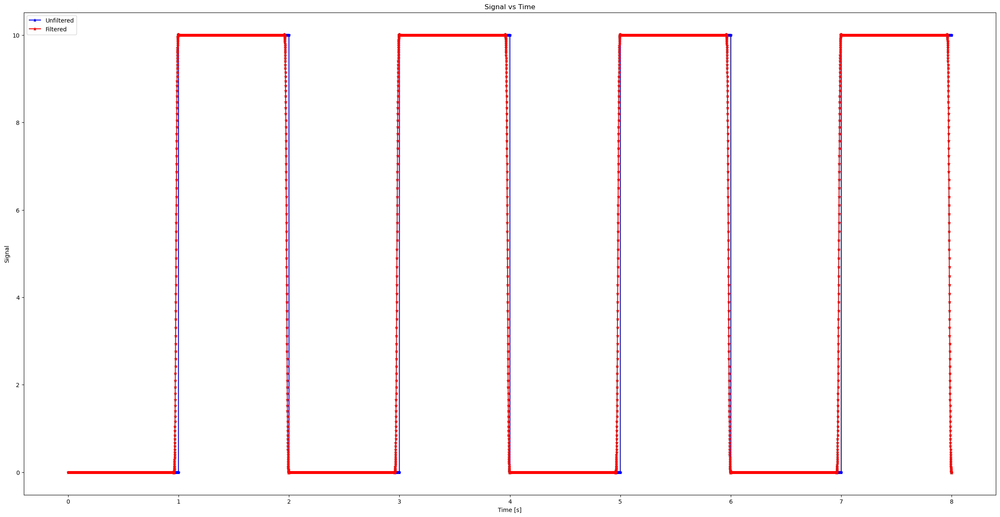

In [315]:
X = 113
sig_weights = [
    -0.000315899445860029,
    -0.000298246662371602,
    -0.000268362674481761,
    -0.000224913258210665,
    -0.000166570596860926,
    -0.000092025500132016,
    0.000000000000000000,
    0.000110739787368416,
    0.000241370650361638,
    0.000392999242896408,
    0.000566649142895299,
    0.000763248136026432,
    0.000983615853665640,
    0.001228451893926448,
    0.001498324553147611,
    0.001793660292421461,
    0.002114734059594157,
    0.002461660581690785,
    0.002834386735948999,
    0.003232685099633646,
    0.003656148769615510,
    0.004104187532407475,
    0.004576025454051566,
    0.005070699947043604,
    0.005587062358482819,
    0.006123780109966024,
    0.006679340405543276,
    0.007252055509454795,
    0.007840069580524448,
    0.008441367035143997,
    0.009053782395898761,
    0.009675011568214553,
    0.010302624473101488,
    0.010934078950285555,
    0.011566735832900748,
    0.012197875082606301,
    0.012824712862629319,
    0.013444419415940170,
    0.014054137606660489,
    0.014651001974987594,
    0.015232158149484604,
    0.015794782455609321,
    0.016336101555901695,
    0.016853411955362468,
    0.017344099205268547,
    0.017805656639994082,
    0.018235703484339075,
    0.018632002173388694,
    0.018992474732998067,
    0.019315218076567404,
    0.019598518082770040,
    0.019840862329236174,
    0.020040951368780029,
    0.020197708447473019,
    0.020310287577587613,
    0.020378079893028370,
    0.020400718230184526,
    0.020378079893028370,
    0.020310287577587613,
    0.020197708447473019,
    0.020040951368780029,
    0.019840862329236174,
    0.019598518082770033,
    0.019315218076567404,
    0.018992474732998067,
    0.018632002173388694,
    0.018235703484339075,
    0.017805656639994082,
    0.017344099205268547,
    0.016853411955362461,
    0.016336101555901695,
    0.015794782455609321,
    0.015232158149484601,
    0.014651001974987594,
    0.014054137606660489,
    0.013444419415940176,
    0.012824712862629319,
    0.012197875082606301,
    0.011566735832900748,
    0.010934078950285548,
    0.010302624473101488,
    0.009675011568214553,
    0.009053782395898765,
    0.008441367035143997,
    0.007840069580524448,
    0.007252055509454795,
    0.006679340405543276,
    0.006123780109966024,
    0.005587062358482819,
    0.005070699947043609,
    0.004576025454051566,
    0.004104187532407475,
    0.003656148769615510,
    0.003232685099633646,
    0.002834386735948999,
    0.002461660581690785,
    0.002114734059594157,
    0.001793660292421461,
    0.001498324553147611,
    0.001228451893926448,
    0.000983615853665640,
    0.000763248136026432,
    0.000566649142895299,
    0.000392999242896409,
    0.000241370650361638,
    0.000110739787368416,
    0.000000000000000000,
    -0.000092025500132016,
    -0.000166570596860926,
    -0.000224913258210665,
    -0.000268362674481761,
    -0.000298246662371602,
    -0.000315899445860029,
]
filtered_data = FIR(data1, sig_weights, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigC FIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

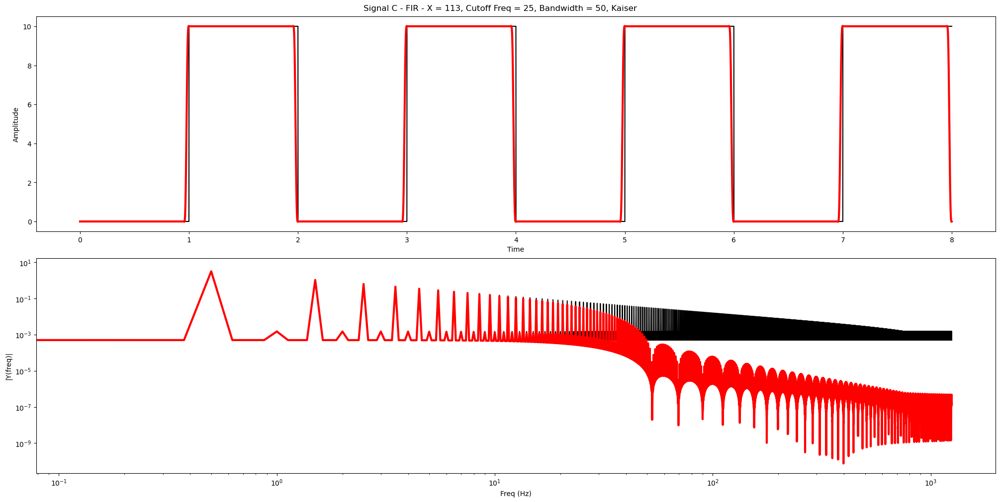

In [316]:
fil = 3
FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 113, Cutoff Freq = 25, Bandwidth = 50, Kaiser")

# Sig D

In [317]:
t = [] # column 0
data1 = [] # column 1
data2 = [] # column 2

with open('sigD.csv') as f:
    # open the csv file
    reader = csv.reader(f)
    for row in reader:
        # read the rows 1 one by one
        t.append(float(row[0])) # leftmost column
        data1.append(float(row[1])) # second column
        #data2.append(float(row[2])) # third column

size_of_t = len(t)
sample_rate = size_of_t/t[-1]
sig = 4
#print("Size of t:", size_of_t)

for i in range(size_of_t):
    # print the data to verify it was read
    #print(str(t[i]) + ", " + str(data1[i]) + ", " + str(data2[i]))
    print(str(t[i]) + ", " + str(data1[i]))


0.0, -0.0379
0.0025, -0.0089
0.005, -0.0331
0.0075, -0.0234
0.01, 0.0225
0.0125, -0.0331
0.015, -0.0621
0.0175, -0.0717
0.02, -0.021
0.0225, -0.0476
0.025, -0.0113
0.0275, 0.0225
0.03, -0.0427
0.0325, -0.0572
0.035, -0.0065
0.0375, -0.0161
0.04, -0.0282
0.0425, 0.0225
0.045, 0.0056
0.0475, -0.0137
0.05, -0.0161
0.0525, -0.0016
0.055, -0.0331
0.0575, 0.0153
0.06, 0.0371
0.0625, -0.0186
0.065, -0.0379
0.0675, -0.0137
0.07, 0.0225
0.0725, -0.0186
0.075, -0.0113
0.0775, 0.0105
0.08, -0.0113
0.0825, -0.0016
0.085, 0.0298
0.0875, -0.0137
0.09, 0.0056
0.0925, 0.0346
0.095, 0.0225
0.0975, -0.004
0.1, -0.0258
0.1025, 0.0419
0.105, 0.0056
0.1075, 0.0516
0.11, 0.0661
0.1125, 0.0129
0.115, 0.008
0.1175, -0.0137
0.12, 0.0443
0.1225, 0.0153
0.125, 0.0443
0.1275, 0.083
0.13, 0.0008
0.1325, -0.0113
0.135, 0.0274
0.1375, 0.0371
0.14, 0.0298
0.1425, 0.0588
0.145, 0.0105
0.1475, -0.0113
0.15, 0.0056
0.1525, 0.0129
0.155, -0.0137
0.1575, 0.0322
0.16, 0.0346
0.1625, 0.0129
0.165, -0.0379
0.1675, -0.0161
0.

In [318]:
print(sample_rate)

400.0833506980621


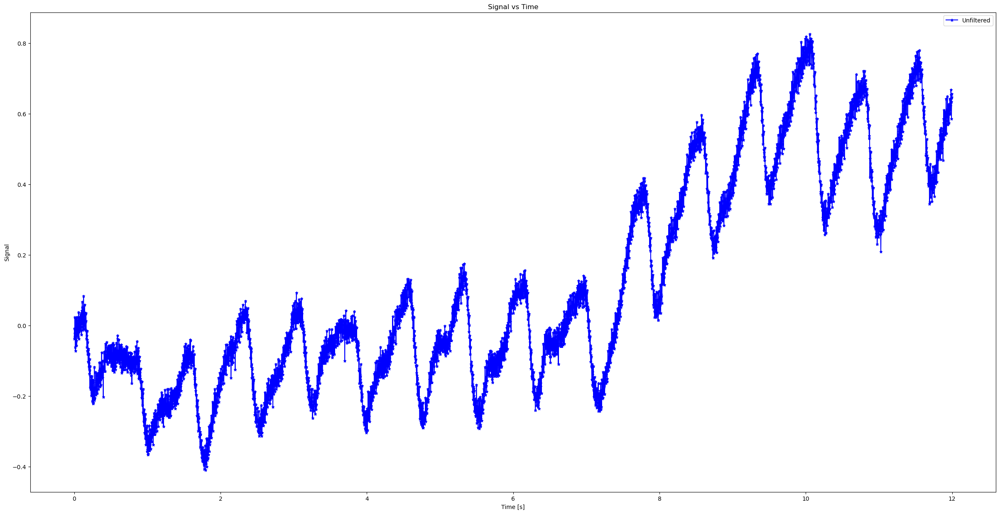

In [319]:
plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5)
plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
#plt.savefig("Line Trajectory.png")
plt.show()

## MAF

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/4183101125.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/4183101125.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


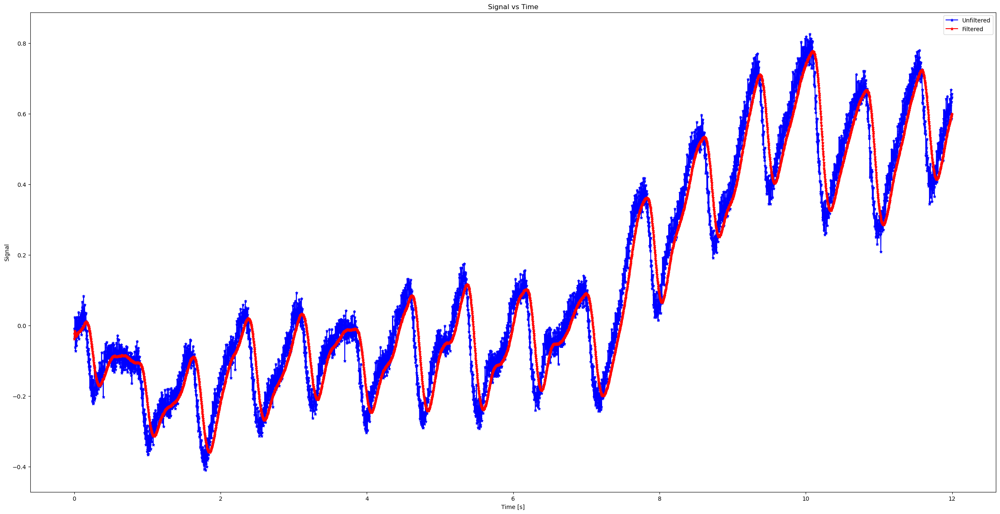

In [320]:
X = 50
filtered_data = MAF(data1, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigD MAF.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

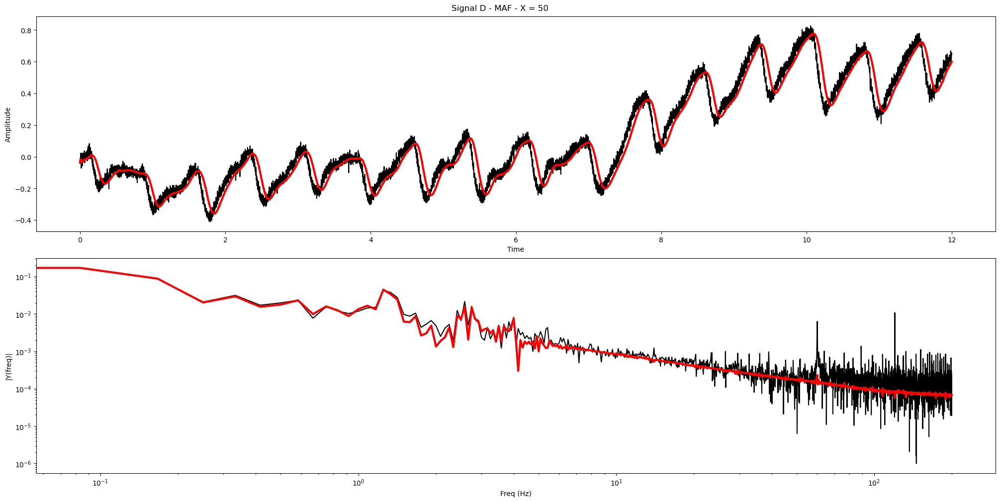

In [321]:
X = 50
fil = 1
filtered_data = MAF(data1, X, size_of_t)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 50")

## IIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3260305172.py:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/3260305172.py:7: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


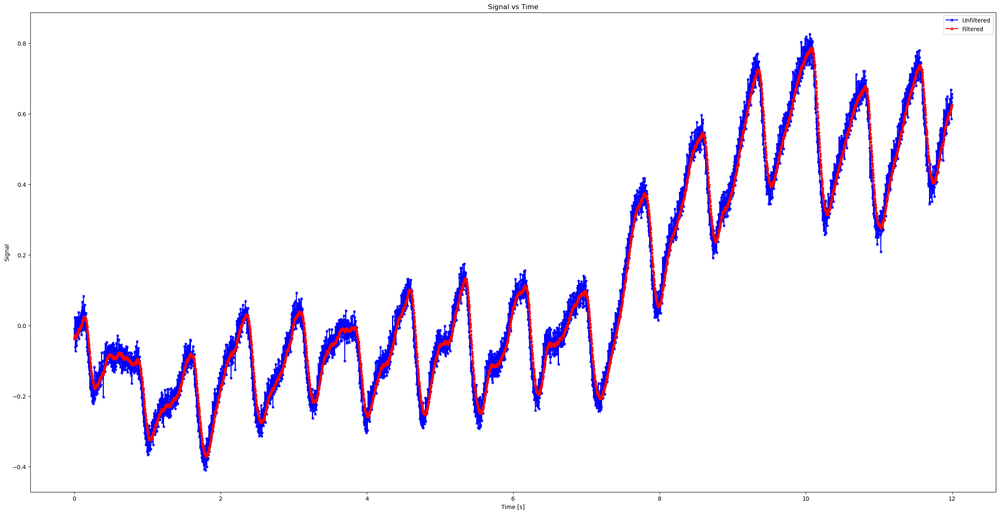

In [322]:
A = 0.9
B = 1 - A
filtered_data = IIR(data1, size_of_t, A, B)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigD IIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

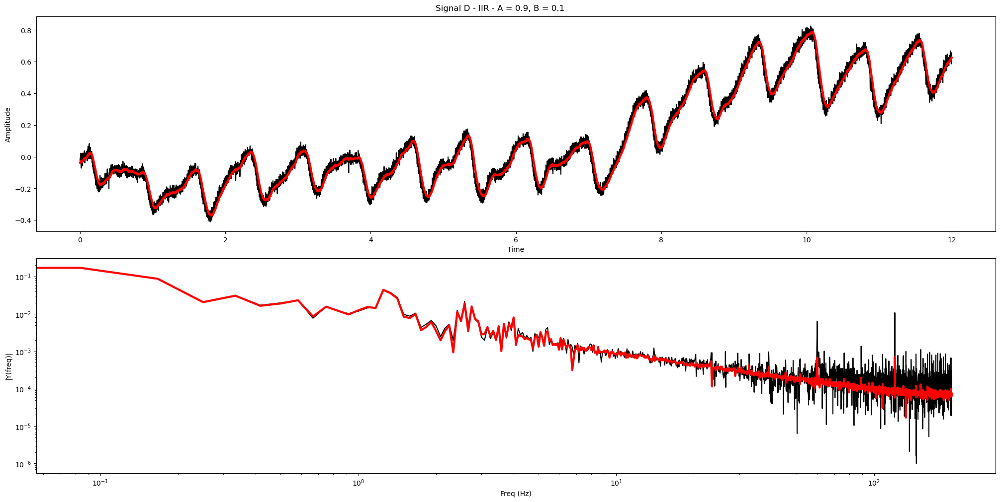

In [323]:
A = 0.9
B = 1 - A
fil = 2
filtered_data = IIR(data1, size_of_t, A, B)

FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "A = 0.9, B = 0.1")

## FIR Filter

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/1301983925.py:64: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/1301983925.py:65: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-*" (-> color='b'). The keyword argument will take precedence.
  plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')


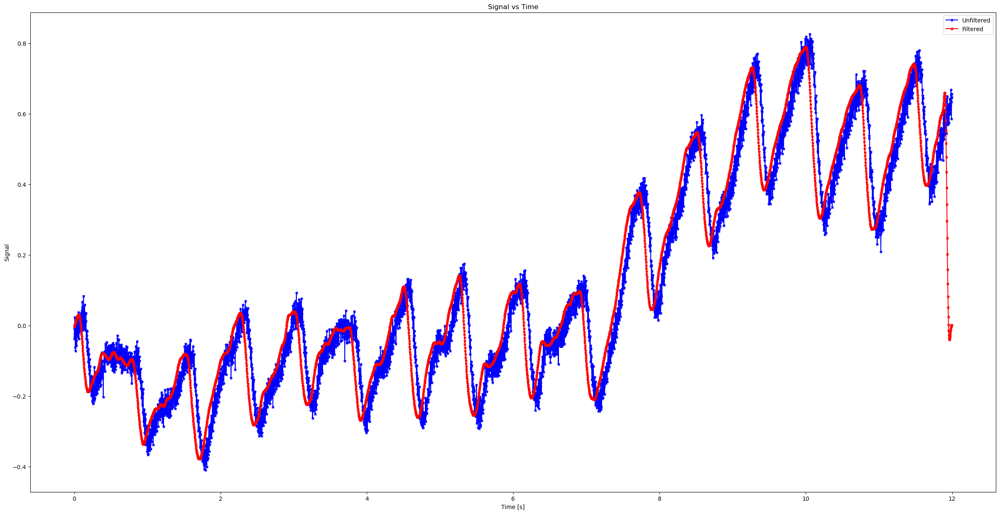

In [324]:
X = 57
sig_weights = [
    0.000525014322205170,
    0.000167626235436453,
    -0.000411622632657048,
    -0.001220098343478917,
    -0.002241153528847721,
    -0.003430333412406431,
    -0.004713530556522527,
    -0.005987521472324848,
    -0.007123144949706999,
    -0.007971168529157715,
    -0.008370653077693375,
    -0.008159386407038085,
    -0.007185737275867435,
    -0.005321102436923086,
    -0.002472000523149823,
    0.001409178100650168,
    0.006315718564726509,
    0.012181257356951018,
    0.018878219619570813,
    0.026220388286352300,
    0.033969669338565205,
    0.041846792140578175,
    0.049545366404118246,
    0.056748435078619403,
    0.063146440319958294,
    0.068455377982943585,
    0.072433868604720231,
    0.074897925488734737,
    0.075732350603287368,
    0.074897925488734737,
    0.072433868604720231,
    0.068455377982943572,
    0.063146440319958294,
    0.056748435078619403,
    0.049545366404118246,
    0.041846792140578175,
    0.033969669338565198,
    0.026220388286352300,
    0.018878219619570813,
    0.012181257356951018,
    0.006315718564726509,
    0.001409178100650169,
    -0.002472000523149823,
    -0.005321102436923086,
    -0.007185737275867435,
    -0.008159386407038085,
    -0.008370653077693375,
    -0.007971168529157715,
    -0.007123144949706999,
    -0.005987521472324848,
    -0.004713530556522526,
    -0.003430333412406431,
    -0.002241153528847721,
    -0.001220098343478917,
    -0.000411622632657048,
    0.000167626235436453,
    0.000525014322205170,
]
filtered_data = FIR(data1, sig_weights, X, size_of_t)

plt.figure(figsize=(30, 15))
plt.plot(t,data1,'b-*', label='Unfiltered', markersize=5, color='blue')
plt.plot(t,filtered_data,'b-*', label='Filtered', markersize=5, color='red')

plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')

plt.legend()
plt.savefig("SigA FIR.png")
plt.show()

/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:19: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, y, 'b', label='Unfiltered', markersize=5, linewidth=1.5, color='black')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:20: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax1.plot(t, z, 'b', label='Filtered', markersize=10, linewidth=3, color='red')
/var/folders/5b/hd0zz73j0sb7hs24b2tg1yy40000gn/T/ipykernel_41392/2018352675.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax2.loglog(frq, abs(Y), 'b', label='Unfiltered', markersize=5, linewi

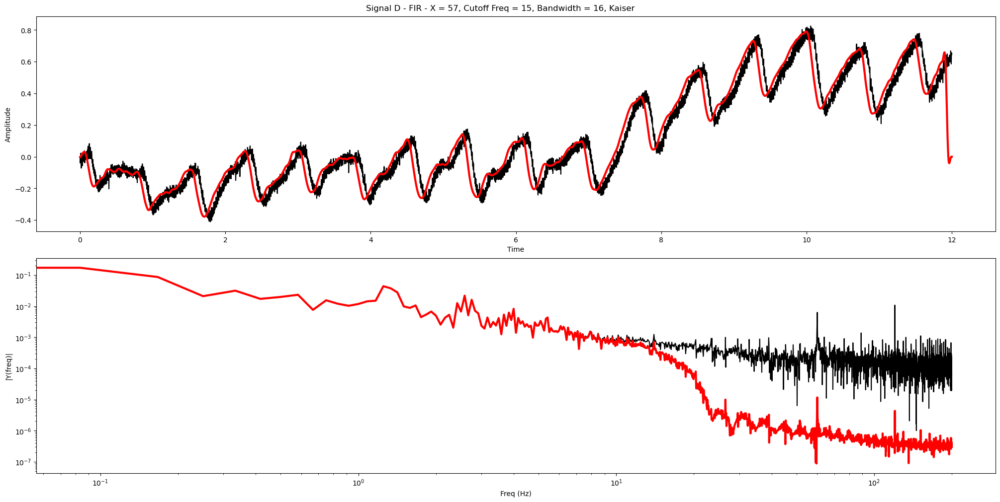

In [325]:
fil = 3
FFT_grapher(t, data1, sample_rate, sig, filtered_data, fil, "X = 57, Cutoff Freq = 15, Bandwidth = 16, Kaiser")

# Sample

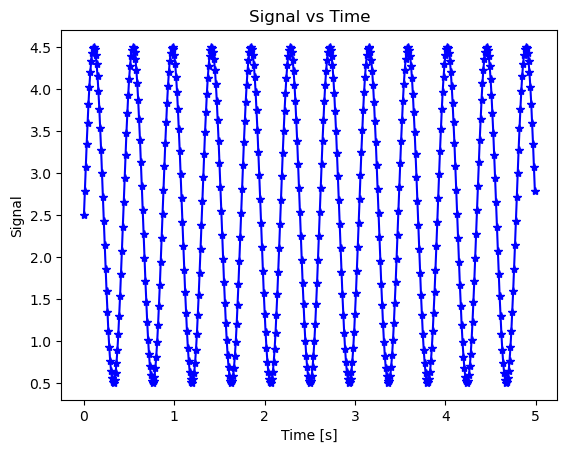

In [9]:
import matplotlib.pyplot as plt # for plotting
import numpy as np # for sine function

dt = 1.0/100.0 # 100Hz
t = np.arange(0.0, 5.0, dt) # for 5s

s = 2.0 * np.sin(2 * np.pi * 2.3 * t) + 2.5 # 2.3Hz

plt.plot(t,s,'b-*')
plt.xlabel('Time [s]')
plt.ylabel('Signal')
plt.title('Signal vs Time')
plt.show()

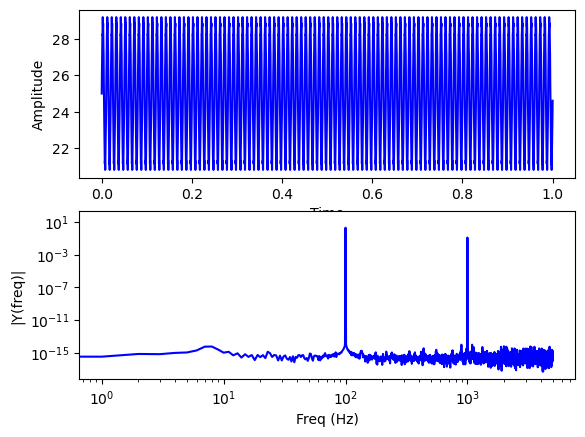

In [53]:
import matplotlib.pyplot as plt
import numpy as np

dt = 1.0/10000.0 # 10kHz
t = np.arange(0.0, 1.0, dt) # 10s
# a constant plus 100Hz and 1000Hz
s = 4.0 * np.sin(2 * np.pi * 100 * t) + 0.25 * np.sin(2 * np.pi * 1000 * t) + 25

Fs = 10000 # sample rate
Ts = 1.0/Fs; # sampling interval
ts = np.arange(0,t[-1],Ts) # time vector
y = s # the data to make the fft from
n = len(y) # length of the signal
k = np.arange(n)
T = n/Fs
frq = k/T # two sides frequency range
frq = frq[range(int(n/2))] # one side frequency range
Y = np.fft.fft(y)/n # fft computing and normalization
Y = Y[range(int(n/2))]

fig, (ax1, ax2) = plt.subplots(2, 1)
ax1.plot(t,y,'b')
ax1.set_xlabel('Time')
ax1.set_ylabel('Amplitude')
ax2.loglog(frq,abs(Y),'b') # plotting the fft
ax2.set_xlabel('Freq (Hz)')
ax2.set_ylabel('|Y(freq)|')
plt.show()